In [4]:
import librosa
import scipy
import IPython.display as ipd
import numpy as np

%matplotlib inline
import matplotlib.pyplot as plt
import librosa.display

(926688,) 22050


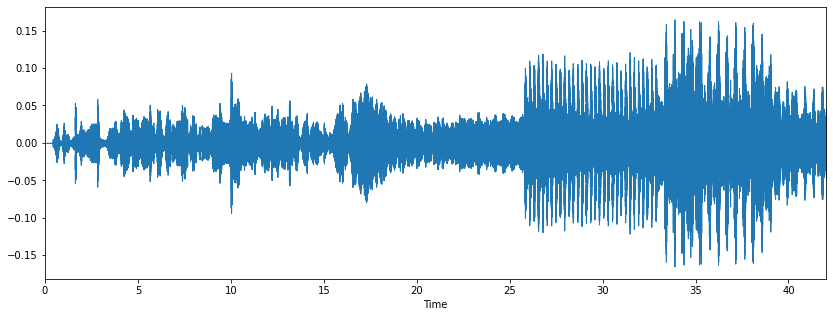

In [5]:
x, sr = librosa.load('audio/feelsoclose.wav')
print(x.shape, sr)

plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr)

ipd.Audio(x, rate=sr)

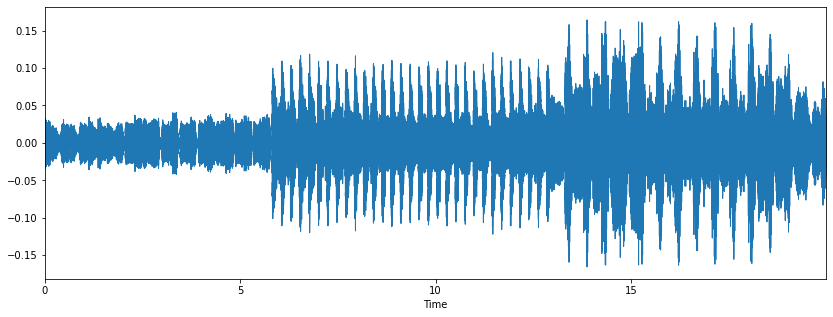

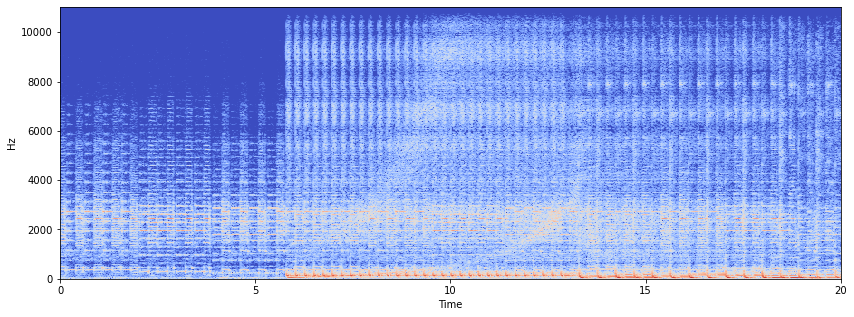

In [6]:
timeframe = np.array([20, 40])*22050

y = x[timeframe[0]:timeframe[1]]

plt.figure(figsize=(14, 5))
librosa.display.waveplot(y, sr)

X = librosa.stft(y)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')

ipd.Audio(y, rate=sr)

(862,)
(862,)


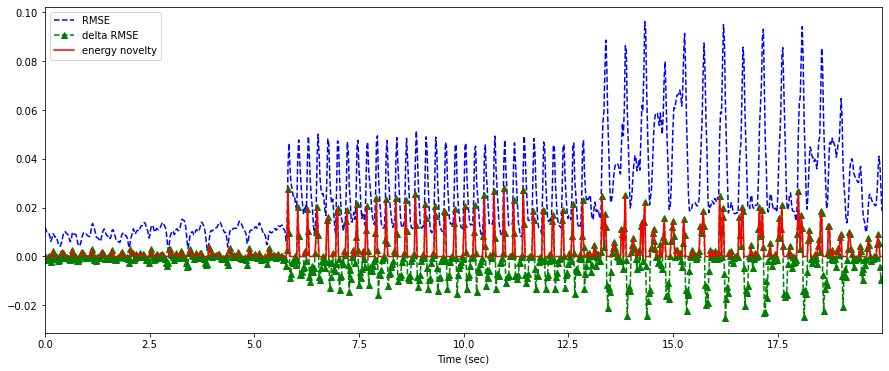

In [10]:
# RMS Energy

hop_length = 512
frame_length = 1024
rmse = librosa.feature.rms(y, frame_length=frame_length, hop_length=hop_length).flatten()
rmse_diff = np.zeros_like(rmse)
rmse_diff[1:] = np.diff(rmse)

print(rmse.shape)
print(rmse_diff.shape)

energy_novelty = np.max([np.zeros_like(rmse_diff), rmse_diff], axis=0)

frames = np.arange(len(rmse))
t = librosa.frames_to_time(frames, sr=sr)

plt.figure(figsize=(15, 6))
plt.plot(t, rmse, 'b--', t, rmse_diff, 'g--^', t, energy_novelty, 'r-')
plt.xlim(0, t.max())
plt.xlabel('Time (sec)')
plt.legend(('RMSE', 'delta RMSE', 'energy novelty')) 

ipd.Audio(y, rate=sr)

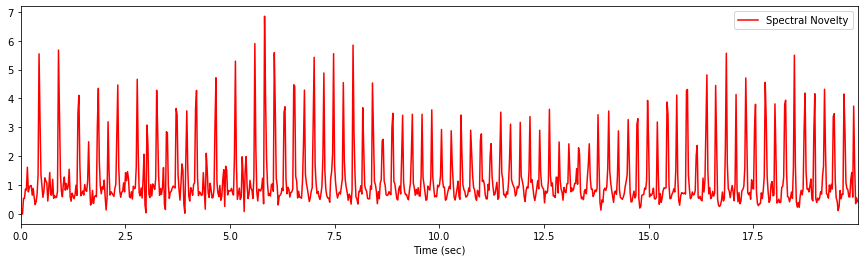

In [46]:
# spectral novelty 

spectral_novelty = librosa.onset.onset_strength(y, sr=sr)

frames = numpy.arange(len(spectral_novelty))
t = librosa.frames_to_time(frames, sr=sr)

plt.figure(figsize=(15, 4))
plt.plot(t, spectral_novelty, 'r-')
plt.xlim(0, t.max())
plt.xlabel('Time (sec)')
plt.legend(('Spectral Novelty',))

[ 15  36  58  68  78  88  96 117 129 138 149 159 169 177 190 197 210 219
 226 230 239 250 260 270 277 289 297 308 318 329 340 351 361 369 381 391
 399 411 421 430 442 452 462 472 482 491 501 512 522 533 541 553 561 573
 592 602 613 619 632 643 653 663 673 684 692 703 713 723 734 740 754 763
 774 781 794 804 815 824 835 846 856]
[ 0.34829932  0.83591837  1.34675737  1.57895692  1.81115646  2.04335601
  2.22911565  2.71673469  2.99537415  3.20435374  3.45977324  3.69197279
  3.92417234  4.10993197  4.41179138  4.57433107  4.87619048  5.08517007
  5.24770975  5.34058957  5.54956916  5.80498866  6.03718821  6.26938776
  6.43192744  6.71056689  6.89632653  7.15174603  7.38394558  7.63936508
  7.89478458  8.15020408  8.38240363  8.56816327  8.84680272  9.07900227
  9.2647619   9.54340136  9.77560091  9.9845805  10.26321995 10.4954195
 10.72761905 10.95981859 11.19201814 11.40099773 11.63319728 11.88861678
 12.12081633 12.37623583 12.56199546 12.84063492 13.02639456 13.30503401
 13.74621315 1

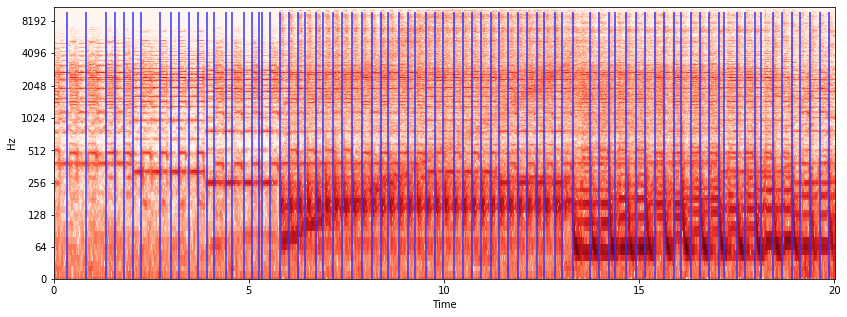

In [60]:
# onset detection

onset_frames = librosa.onset.onset_detect(y, sr=sr, wait=1, pre_avg=1, post_avg=1, pre_max=1, post_max=1, backtrack=True)
print(onset_frames) # frame numbers of estimated onsets

onset_times = librosa.frames_to_time(onset_frames)
print(onset_times)

S = librosa.stft(y)
logS = librosa.amplitude_to_db(abs(S))

plt.figure(figsize=(14, 5))
librosa.display.specshow(logS, sr=sr, x_axis='time', y_axis='log', cmap='Reds')
plt.vlines(onset_times, 0, 10000, color='#3333FF')

clicks = librosa.clicks(frames=onset_frames, sr=sr, length=len(y))
#ipd.Audio(y + clicks, rate=sr)
ipd.Audio(numpy.vstack([y, clicks]), rate=sr)

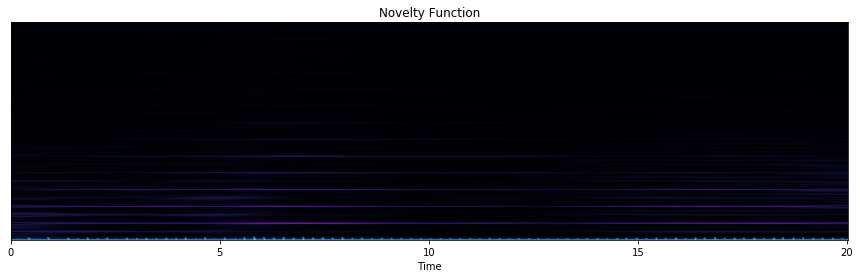

In [63]:
# Tempo Estimation

hop_length = 200 # samples per frame
onset_env = librosa.onset.onset_strength(y, sr=sr, hop_length=hop_length, n_fft=2048)

frames = range(len(onset_env))
t = librosa.frames_to_time(frames, sr=sr, hop_length=hop_length)

plt.figure(figsize=(15, 4))
plt.plot(t, onset_env)
plt.xlim(0, t.max())
plt.ylim(0)
plt.xlabel('Time (sec)')
plt.title('Novelty Function')

S = librosa.stft(onset_env, hop_length=1, n_fft=512)
fourier_tempogram = numpy.absolute(S)

librosa.display.specshow(fourier_tempogram, sr=sr, hop_length=hop_length, x_axis='time')

(0, 88.88721755747707)

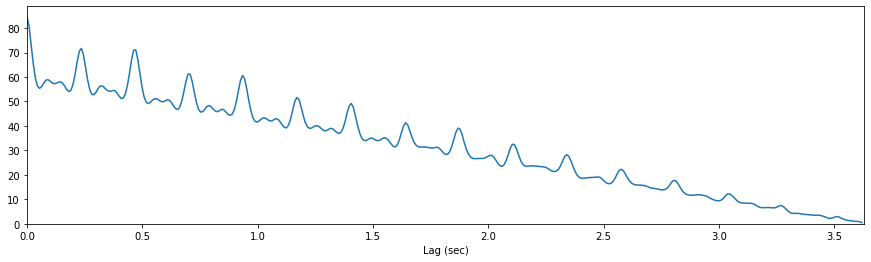

In [66]:
n0 = 100
n1 = 500

tmp = numpy.log1p(onset_env[n0:n1])
r = librosa.autocorrelate(tmp)

plt.figure(figsize=(15, 4))
plt.plot(t[:n1-n0], r)
plt.xlim(t[0], t[n1-n0])
plt.xlabel('Lag (sec)')
plt.ylim(0)

<ipython-input-70-18eb93a775cf>:2: RuntimeWarning: divide by zero encountered in true_divide
  plt.plot(60/t[:n1-n0], r)


(0, 84.80222324676508)

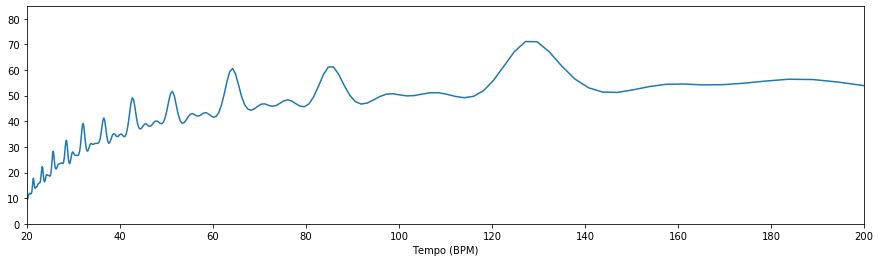

In [70]:
plt.figure(figsize=(15, 4))
plt.plot(60/t[:n1-n0], r)
plt.xlim(20, 200)
plt.xlabel('Tempo (BPM)')
plt.ylim(0)

[129.19921875]


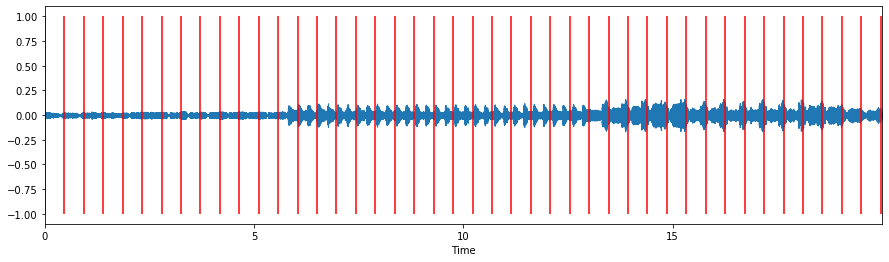

In [74]:
tempo = librosa.beat.tempo(y, sr=sr)
print(tempo)

T = len(y)/float(sr)
seconds_per_beat = 60.0/tempo[0]
beat_times = numpy.arange(0, T, seconds_per_beat)

plt.figure(figsize=(15, 4))
librosa.display.waveplot(y)
plt.vlines(beat_times, -1, 1, color='r')

clicks = librosa.clicks(beat_times, sr, length=len(y))
ipd.Audio(numpy.vstack([y, clicks]), rate=sr)

64.599609375
[ 0.46439909  1.39319728  2.32199546  3.27401361  4.20281179  5.13160998
  6.06040816  7.0124263   7.94122449  8.89324263  9.82204082 10.77405896
 11.70285714 12.63165533 13.58367347 14.51247166 15.4644898  16.39328798
 17.32208617 18.27410431]


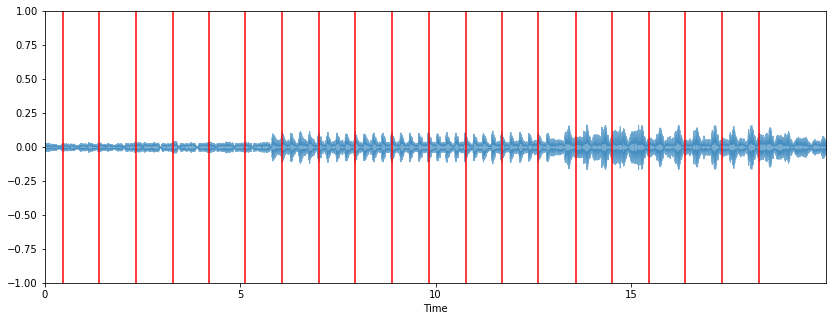

In [77]:
tempo, beat_times = librosa.beat.beat_track(y, sr=sr, start_bpm=60, units='time')
print(tempo)
print(beat_times)

plt.figure(figsize=(14, 5))
librosa.display.waveplot(y, alpha=0.6)
plt.vlines(beat_times, -1, 1, color='r')
plt.ylim(-1, 1)

clicks = librosa.clicks(beat_times, sr=sr, length=len(y))
ipd.Audio(y + clicks, rate=sr)

In [83]:
# Spectral representation

D = librosa.stft(y)
print(D.shape, D.dtype)

S, phase = librosa.magphase(D)
print(S.dtype, phase.dtype, np.allclose(D, S * phase))

C = librosa.cqt(y, sr=sr)
print(C.shape, C.dtype)

(1025, 862) complex64
float32 complex64 True
(84, 862) complex128


In [91]:
phase.shape

(1025, 862)